- pretraining with tiny person
- test with water data

In [1]:
import os
import re
import zipfile

import numpy as np
import tensorflow as tf
from tensorflow import keras

import matplotlib.pyplot as plt
import tensorflow_datasets as tfds
import pandas as pd

from PIL import Image
import ast
import json
from glob import glob

In [2]:
is_dense_only = True

dense : m 49
sparse : m 717

In [3]:
visdrone_categories = ['bg','pedestrian', 'person', 'car', 'van', 'bus', 'truck', 'motor', 'bicycle', 'awning-tricycle', 'tricycle','empty_0','empty_1']
WATER_CLASSES = visdrone_categories
num_classes = 100#len(WATER_CLASSES)
l1 = 1e-8
activation = 'selu'

In [4]:
path_visDrone = '/home/sogangori/Downloads/VisDrone2019/VisDrone2019-DET-val/'
path_visDrone_annotation = path_visDrone + 'annotations/'
path_visDrone_image = path_visDrone + 'images/'
os.path.isdir(path_visDrone_annotation), os.path.isdir(path_visDrone_image)
folder_water_image = '/home/sogangori/Downloads/water/'
os.path.isdir(folder_water_image)

True

In [5]:
def load_visdrone_data(path_visDrone, human_only=True):
    
    list_image_arr = []
    list_cbbox = []
    path_visDrone_annotation = path_visDrone + 'annotations/'
    path_visDrone_image = path_visDrone + 'images/'
    os.path.isdir(path_visDrone_annotation), os.path.isdir(path_visDrone_image)
    list_annotation = glob(path_visDrone_annotation+'*.*')
    list_image_path = glob(path_visDrone_image+'*.*')
    len(list_annotation), len(list_image_path), list_annotation[0]
    
    for i in range(len(list_annotation)):
        path_annotation = list_annotation[i]
        
        df = pd.read_csv(path_annotation, header=None)
        
        bbox_xywh = np.array(df.iloc[:, :4])
        cls = np.array(df.iloc[:, 5])
        x0 = bbox_xywh[:, 0]
        y0 = bbox_xywh[:, 1]
        w = bbox_xywh[:, 2]
        h = bbox_xywh[:, 3]
        x1 = x0 + w
        y1 = y0 + h
        
        file_name_annotation = path_annotation.split('/')[-1].split('.')[0]
        file_name_image = path_visDrone_image+file_name_annotation+'.jpg'
        img = Image.open(file_name_image)
        img_arr = np.array(img)
        img_h, img_w, img_c = img_arr.shape
        cbbox_norm = np.stack((cls, y0/img_h, x0/img_w, y1/img_h, x1/img_w), axis=1)
        
        if human_only:
            
            human_mask = np.logical_and(cls > 0, cls < 3)
            vehicle_mask = cls > 2
            is_human_contain = np.any(human_mask)
            human_count = np.count_nonzero(human_mask)
            if not is_human_contain or human_count < 30:#30:154, 40:88                
                continue
            
            cls = np.where(human_mask, 1.0, cls)
            cls = np.where(vehicle_mask, 3.0, cls)
            cbbox_norm = np.stack((cls, y0/img_h, x0/img_w, y1/img_h, x1/img_w), axis=1)
            #cbbox_norm = cbbox_norm[human_mask]               
            #cbbox_norm[:, 0] = 1

        list_image_arr.append(img_arr)
        list_cbbox.append(cbbox_norm)
        if i%100==0:
            print(len(list_annotation), i, file_name_annotation, img_arr.shape)
    return list_image_arr, list_cbbox

In [6]:
path_visDrone = '/home/sogangori/Downloads/VisDrone2019/VisDrone2019-DET-val/'
list_visdrone_image_arr, list_visdrone_cbbox = load_visdrone_data(path_visDrone)
print(len(list_visdrone_image_arr))

548 0 0000327_02801_d_0000725 (765, 1360, 3)
548 100 0000327_01401_d_0000718 (765, 1360, 3)
154


(array([ 644.,    0.,    0., 8306.,    0.,    0.,    0.,    0.,    0.,
        9655.]),
 array([0. , 0.3, 0.6, 0.9, 1.2, 1.5, 1.8, 2.1, 2.4, 2.7, 3. ]),
 <a list of 10 Patch objects>)

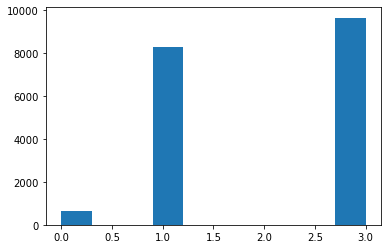

In [7]:
visdrone_cbbox = np.concatenate(list_visdrone_cbbox, 0)
visdrone_cbbox.shape
plt.hist(visdrone_cbbox[:, 0])

In [8]:
img_paths = glob(folder_water_image + '*.*')
len(img_paths)

96

In [9]:
water_images = []
for img_path in img_paths:
    img = Image.open(img_path)
    water_images.append(np.array(img))
len(water_images), water_images[0].shape     

(96, (1080, 1920, 3))

In [10]:
input_list_all = list_visdrone_image_arr
bbox_list_all = list_visdrone_cbbox
print('extend', len(list_visdrone_image_arr), len(input_list_all), len(bbox_list_all))

extend 154 154 154


In [11]:
colors = np.random.rand(num_classes, 3)
def visualize_detections_simple(
    image, boxes, classes, figsize=(12, 12),
):
    """Visualize Detections"""
    image = np.array(image, dtype=np.uint8)
    img_h, img_w, img_c = image.shape
    plt.figure(figsize=figsize)
    plt.axis("off")
    plt.imshow(image)
    ax = plt.gca()
    boxes_width = boxes[:, 3] - boxes[:, 1]
    boxes_height = boxes[:, 2] - boxes[:, 0]
    box_min_width = np.min(boxes_width)
    box_mean_width = np.mean(boxes_width)
    box_max_width = np.max(boxes_width)
    title = str.format('(%dx%d) %d box, width:min:%d mean:%d max:%d' 
                       %(img_h, img_w, len(boxes), box_min_width, box_mean_width, box_max_width))
    plt.title(title)
    
    for box, cls in zip(boxes, classes):
        y1, x1, y2, x2 = box        
        w, h = x2 - x1, y2 - y1
        cls = int(cls)
        color = colors[cls]
        patch = plt.Rectangle(
            [x1, y1], w, h, fill=False, edgecolor=color, linewidth=1
        )
        ax.add_patch(patch)
        ax.text(
            x1, y1, str(cls), bbox={"facecolor": color, "alpha": 0.4}, clip_box=ax.clipbox, clip_on=True,
        )
    plt.show()
    return ax

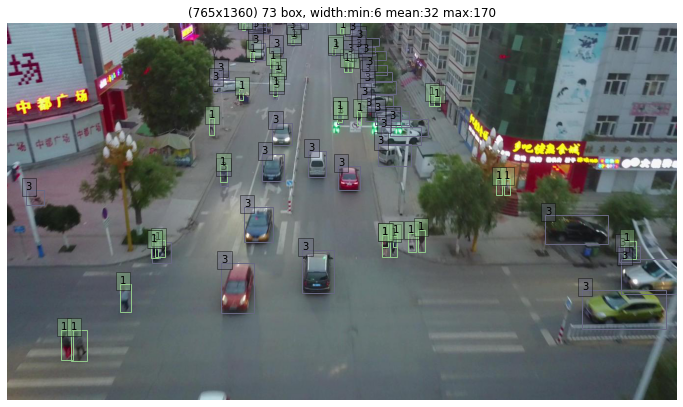

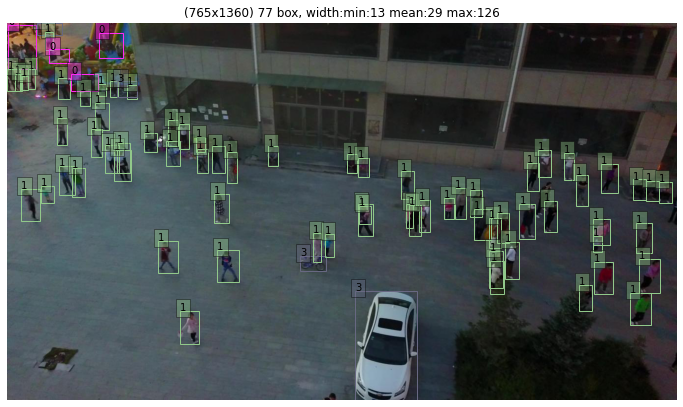

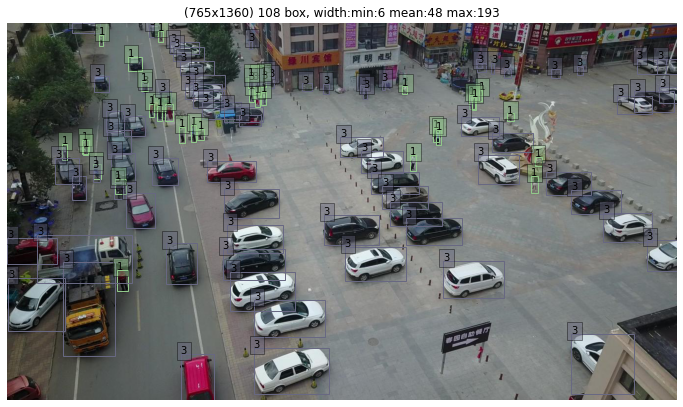

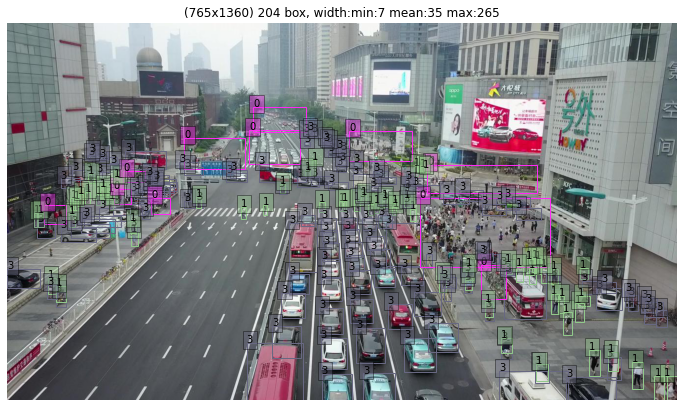

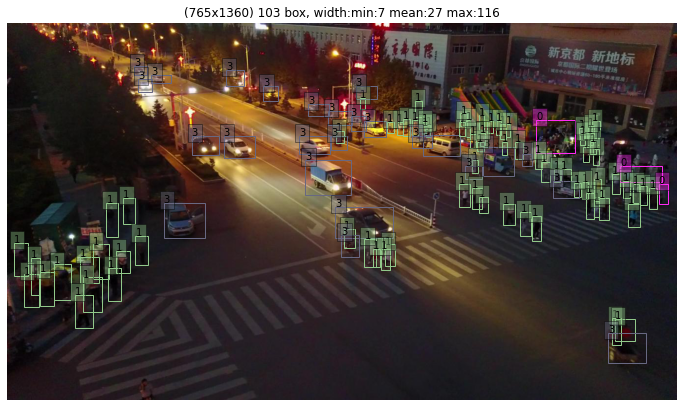

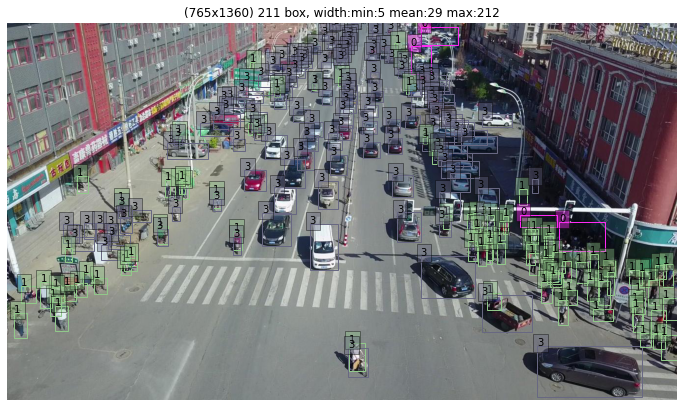

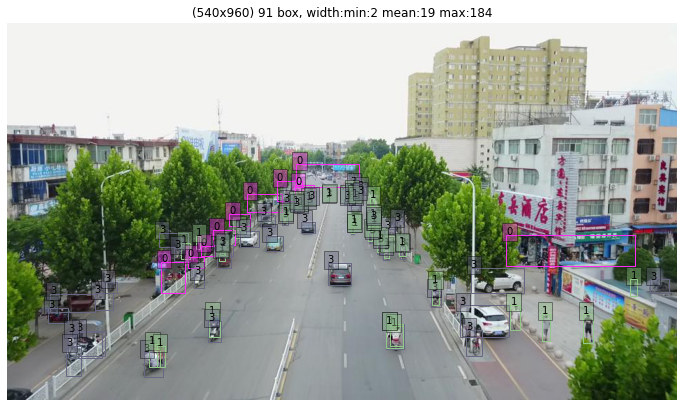

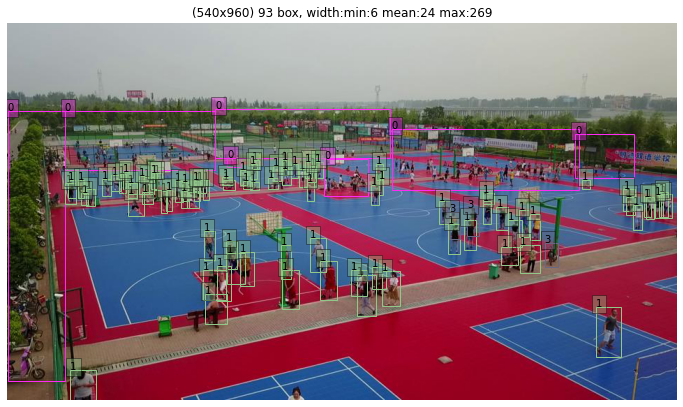

In [12]:
for i in range(len(input_list_all)):
    if i%20==0:
        img_arr = input_list_all[i]
        sample_box = bbox_list_all[i]
        label = sample_box[:, 0]
        bbox = sample_box[:, 1:]

        h, w, c = img_arr.shape
        #if w<2000: continue
        scale = np.array((h, w, h, w), dtype=np.float)
        scale = np.reshape(scale, (1, 4))
        bbox_norm = bbox.astype(np.float) * scale
        #print('bbox_norm', bbox, bbox_norm)
        ax = visualize_detections_simple(img_arr,bbox_norm,label)
    

In [37]:
import os
import re
import zipfile

import numpy as np
import tensorflow as tf
from tensorflow import keras

import matplotlib.pyplot as plt
import tensorflow_datasets as tfds


def swap_xy(boxes):
    """Swaps order the of x and y coordinates of the boxes.
    Arguments:
      boxes: A tensor with shape `(num_boxes, 4)` representing bounding boxes.
    Returns:
      swapped boxes with shape same as that of boxes.
    """
    return tf.stack([boxes[:, 1], boxes[:, 0], boxes[:, 3], boxes[:, 2]], axis=-1)


def convert_to_xywh(boxes):
    """Changes the box format to center, width and height.
    Arguments:
      boxes: A tensor of rank 2 or higher with a shape of `(..., num_boxes, 4)`
        representing bounding boxes where each box is of the format
        `[xmin, ymin, xmax, ymax]`.
    Returns:
      converted boxes with shape same as that of boxes.
    """
    return tf.concat(
        [(boxes[..., :2] + boxes[..., 2:]) / 2.0, boxes[..., 2:] - boxes[..., :2]],
        axis=-1,
    )


def convert_to_corners(boxes):
    """Changes the box format to corner coordinates
    Arguments:
      boxes: A tensor of rank 2 or higher with a shape of `(..., num_boxes, 4)`
        representing bounding boxes where each box is of the format
        `[x, y, width, height]`.
    Returns:
      converted boxes with shape same as that of boxes.
    """
    return tf.concat(
        [boxes[..., :2] - boxes[..., 2:] / 2.0, boxes[..., :2] + boxes[..., 2:] / 2.0],
        axis=-1,
    )


"""
## Computing pairwise Intersection Over Union (IOU)
As we will see later in the example, we would be assigning ground truth boxes
to anchor boxes based on the extent of overlapping. This will require us to
calculate the Intersection Over Union (IOU) between all the anchor
boxes and ground truth boxes pairs.
"""

#compute_iou(anchor_boxes, gt_boxes)
def compute_iou(boxes1, boxes2):
    """Computes pairwise IOU matrix for given two sets of boxes
    Arguments:
      boxes1: A tensor with shape `(N, 4)` representing bounding boxes
        where each box is of the format `[x, y, width, height]`.
        boxes2: A tensor with shape `(M, 4)` representing bounding boxes
        where each box is of the format `[x, y, width, height]`.
    Returns:
      pairwise IOU matrix with shape `(N, M)`, where the value at ith row
        jth column holds the IOU between ith box and jth box from
        boxes1 and boxes2 respectively.
    """
    boxes1_corners = convert_to_corners(boxes1)
    boxes2_corners = convert_to_corners(boxes2)
    lu = tf.maximum(boxes1_corners[:, None, :2], boxes2_corners[:, :2])
    rd = tf.minimum(boxes1_corners[:, None, 2:], boxes2_corners[:, 2:])
    intersection = tf.maximum(0.0, rd - lu)
    intersection_area = intersection[:, :, 0] * intersection[:, :, 1]
    boxes1_area = boxes1[:, 2] * boxes1[:, 3]
    boxes2_area = boxes2[:, 2] * boxes2[:, 3]
    union_area = tf.maximum(
        boxes1_area[:, None] + boxes2_area - intersection_area, 1e-8
    )
    return tf.clip_by_value(intersection_area / union_area, 0.0, 1.0)


def visualize_detections(
    image, boxes, classes, scores, figsize=(10, 10), linewidth=1, color=[0, 0, 1], 
    boxes_gt=None):
    """Visualize Detections"""
    image = np.array(image, dtype=np.uint8)
    plt.figure(figsize=figsize)
    plt.axis("off")
    plt.imshow(image)
    ax = plt.gca()    
         
    if boxes_gt is not None:
        for box in boxes_gt:        
            y1, x1, y2, x2 = box
            w, h = x2 - x1, y2 - y1
            patch = plt.Rectangle(
                [x1, y1], w, h, fill=False, edgecolor=[0,1,0], linewidth=linewidth
            )
            ax.add_patch(patch)
            
    for box, _cls, score in zip(boxes, classes, scores):
        #text = "{}: {:.2f}".format(_cls, score)
        x1, y1, x2, y2 = box
        w, h = x2 - x1, y2 - y1
        patch = plt.Rectangle(
            [x1, y1], w, h, fill=False, edgecolor=color, linewidth=linewidth
        )
        ax.add_patch(patch)
        #ax.text(x1, y1, str(_cls), bbox={"facecolor": color, "alpha": 0.4}, clip_box=ax.clipbox, clip_on=True,)
   
        
    plt.show()
    return ax


"""
## Implementing Anchor generator
Anchor boxes are fixed sized boxes that the model uses to predict the bounding
box for an object. It does this by regressing the offset between the location
of the object's center and the center of an anchor box, and then uses the width
and height of the anchor box to predict a relative scale of the object. In the
case of RetinaNet, each location on a given feature map has nine anchor boxes
(at three scales and three ratios).
"""


class AnchorBox:
    """Generates anchor boxes.
    This class has operations to generate anchor boxes for feature maps at
    strides `[8, 16, 32, 64, 128]`. Where each anchor each box is of the
    format `[x, y, width, height]`.
    Attributes:
      aspect_ratios: A list of float values representing the aspect ratios of
        the anchor boxes at each location on the feature map
      scales: A list of float values representing the scale of the anchor boxes
        at each location on the feature map.
      num_anchors: The number of anchor boxes at each location on feature map
      areas: A list of float values representing the areas of the anchor
        boxes for each feature map in the feature pyramid.
      strides: A list of float value representing the strides for each feature
        map in the feature pyramid.
    """

    def __init__(self):
        #self.aspect_ratios = [0.5, 1.0, 2.0]        
        #self.scales = [2 ** x for x in [0, 1 / 3, 2 / 3]]
        self.aspect_ratios = [1.0]        
        self.scales = [2 ** x for x in [0]]
                
        self._num_anchors = len(self.aspect_ratios) * len(self.scales)
        #self._strides = [2 ** i for i in range(3, 8)]
        #self._areas = [x ** 2 for x in [32.0, 64.0, 128.0, 256.0, 512.0]]
        self._strides = [2 ** i for i in range(3, 7)]
        self._areas = [x ** 2 for x in [32.0, 64.0, 128.0, 256.0]]
        #self._areas = [x ** 2 for x in [16.0, 32.0, 64.0, 128.0]]
        self._anchor_dims = self._compute_dims()

    def _compute_dims(self):
        """Computes anchor box dimensions for all ratios and scales at all levels
        of the feature pyramid.
        """
        anchor_dims_all = []
        for area in self._areas:
            anchor_dims = []
            for ratio in self.aspect_ratios:
                anchor_height = tf.math.sqrt(area / ratio)
                anchor_width = area / anchor_height
                dims = tf.reshape(
                    tf.stack([anchor_width, anchor_height], axis=-1), [1, 1, 2]
                )
                for scale in self.scales:
                    anchor_dims.append(scale * dims)
            anchor_dims_all.append(tf.stack(anchor_dims, axis=-2))
        return anchor_dims_all

    def _get_anchors(self, feature_height, feature_width, level):
        """Generates anchor boxes for a given feature map size and level
        Arguments:
          feature_height: An integer representing the height of the feature map.
          feature_width: An integer representing the width of the feature map.
          level: An integer representing the level of the feature map in the
            feature pyramid.
        Returns:
          anchor boxes with the shape
          `(feature_height * feature_width * num_anchors, 4)`
        """
        rx = tf.range(feature_width, dtype=tf.float32) + 0.5
        ry = tf.range(feature_height, dtype=tf.float32) + 0.5
        centers = tf.stack(tf.meshgrid(rx, ry), axis=-1) * self._strides[level - 3]
        centers = tf.expand_dims(centers, axis=-2)
        centers = tf.tile(centers, [1, 1, self._num_anchors, 1])
        dims = tf.tile(
            self._anchor_dims[level - 3], [feature_height, feature_width, 1, 1]
        )
        anchors = tf.concat([centers, dims], axis=-1)
        return tf.reshape(
            anchors, [feature_height * feature_width * self._num_anchors, 4]
        )

    def get_anchors(self, image_height, image_width):
        """Generates anchor boxes for all the feature maps of the feature pyramid.
        Arguments:
          image_height: Height of the input image.
          image_width: Width of the input image.
        Returns:
          anchor boxes for all the feature maps, stacked as a single tensor
            with shape `(total_anchors, 4)`
        """
        anchors = [
            self._get_anchors(
                tf.math.ceil(image_height / 2 ** i),
                tf.math.ceil(image_width / 2 ** i),
                i,
            )
            for i in range(3, 7)
        ]
        return tf.concat(anchors, axis=0)


"""
## Preprocessing data
Preprocessing the images involves two steps:
- Resizing the image: Images are resized such that the shortest size is equal
to 800 px, after resizing if the longest side of the image exceeds 1333 px,
the image is resized such that the longest size is now capped at 1333 px.
- Applying augmentation: Random scale jittering  and random horizontal flipping
are the only augmentations applied to the images.
Along with the images, bounding boxes are rescaled and flipped if required.
"""


def random_flip_horizontal(image, boxes):
    """Flips image and boxes horizontally with 50% chance
    Arguments:
      image: A 3-D tensor of shape `(height, width, channels)` representing an
        image.
      boxes: A tensor with shape `(num_boxes, 4)` representing bounding boxes,
        having normalized coordinates.
    Returns:
      Randomly flipped image and boxes
    """
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_left_right(image)
        boxes = tf.stack([1 - boxes[:, 2], boxes[:, 1], 1 - boxes[:, 0], boxes[:, 3]], axis=-1)
        
    return image, boxes



def resize_and_pad_image_bbox(
    image, bbox, min_side=1024.0, max_side=11333.0, jitter=[128*8-3, 128*8+1], stride=128.0
):
    image_shape = (1024, 1920)
    ratio = (1, 1)
    diff_shape = tf.cast(tf.shape(image)[:2], tf.float32) - tf.cast(image_shape, tf.float32)
    is_same_shape = tf.reduce_sum(tf.abs(diff_shape)) < 1
    image = tf.cond(is_same_shape, lambda: tf.cast(image, tf.float32), lambda:tf.image.resize(image, image_shape))
    #image = tf.image.resize(image, image_shape)
   
    return image, image_shape, ratio, bbox

def resize_and_pad_image_bbox_backup(
    image, bbox, min_side=1024.0, max_side=11333.0, jitter=[128*7+1, 128*9-1], stride=128.0
):
    #image, min_side=800.0, max_side=1333.0, jitter=[640, 1024], stride=128.0
    """Resizes and pads image while preserving aspect ratio.
    1. Resizes images so that the shorter side is equal to `min_side`
    2. If the longer side is greater than `max_side`, then resize the image
      with longer side equal to `max_side`
    3. Pad with zeros on right and bottom to make the image shape divisible by
    `stride`
    Arguments:
      image: A 3-D tensor of shape `(height, width, channels)` representing an
        image.
      min_side: The shorter side of the image is resized to this value, if
        `jitter` is set to None.
      max_side: If the longer side of the image exceeds this value after
        resizing, the image is resized such that the longer side now equals to
        this value.
      jitter: A list of floats containing minimum and maximum size for scale
        jittering. If available, the shorter side of the image will be
        resized to a random value in this range.
      stride: The stride of the smallest feature map in the feature pyramid.
        Can be calculated using `image_size / feature_map_size`.
    Returns:
      image: Resized and padded image.
      image_shape: Shape of the image before padding.
      ratio: The scaling factor used to resize the image
    """
    image_shape = tf.cast(tf.shape(image)[:2], dtype=tf.float32)
    if jitter is not None:
        min_side = tf.random.uniform((), jitter[0], jitter[1], dtype=tf.float32)
    ratio = min_side / tf.reduce_min(image_shape)
    if ratio * tf.reduce_max(image_shape) > max_side:
        ratio = max_side / tf.reduce_max(image_shape)
    image_shape = ratio * image_shape
    image = tf.image.resize(image, tf.cast(image_shape, dtype=tf.int32))
    padded_image_shape = tf.cast(
        tf.math.ceil(image_shape / stride) * stride, dtype=tf.int32
    )
    image = tf.image.pad_to_bounding_box(
        image, 0, 0, padded_image_shape[0], padded_image_shape[1]
    )
         
    pad_ratio = image_shape / tf.cast(padded_image_shape, tf.float32)    
    bbox_padded = tf.stack(
        [
            bbox[:, 0] * pad_ratio[1],
            bbox[:, 1] * pad_ratio[0],
            bbox[:, 2] * pad_ratio[1],
            bbox[:, 3] * pad_ratio[0],
        ],
        axis=-1,
    )
    return image, image_shape, ratio, bbox_padded

def resize_and_pad_image(
    image, min_side=1024.0, max_side=11333.0, jitter=[128*8-3, 128*8], stride=128.0
):
    #image, min_side=800.0, max_side=1333.0, jitter=[640, 1024], stride=128.0
    """Resizes and pads image while preserving aspect ratio.
    1. Resizes images so that the shorter side is equal to `min_side`
    2. If the longer side is greater than `max_side`, then resize the image
      with longer side equal to `max_side`
    3. Pad with zeros on right and bottom to make the image shape divisible by
    `stride`
    Arguments:
      image: A 3-D tensor of shape `(height, width, channels)` representing an
        image.
      min_side: The shorter side of the image is resized to this value, if
        `jitter` is set to None.
      max_side: If the longer side of the image exceeds this value after
        resizing, the image is resized such that the longer side now equals to
        this value.
      jitter: A list of floats containing minimum and maximum size for scale
        jittering. If available, the shorter side of the image will be
        resized to a random value in this range.
      stride: The stride of the smallest feature map in the feature pyramid.
        Can be calculated using `image_size / feature_map_size`.
    Returns:
      image: Resized and padded image.
      image_shape: Shape of the image before padding.
      ratio: The scaling factor used to resize the image
    """
    image_shape = tf.cast(tf.shape(image)[:2], dtype=tf.float32)
    if jitter is not None:
        min_side = tf.random.uniform((), jitter[0], jitter[1], dtype=tf.float32)
    ratio = min_side / tf.reduce_min(image_shape)
    if ratio * tf.reduce_max(image_shape) > max_side:
        ratio = max_side / tf.reduce_max(image_shape)
    image_shape = ratio * image_shape
    image = tf.image.resize(image, tf.cast(image_shape, dtype=tf.int32))
    padded_image_shape = tf.cast(
        tf.math.ceil(image_shape / stride) * stride, dtype=tf.int32
    )
    image = tf.image.pad_to_bounding_box(
        image, 0, 0, padded_image_shape[0], padded_image_shape[1]
    ) 
    
    return image, image_shape, ratio


def preprocess_data(image, cls_bbox):
    """Applies preprocessing step to a single sample
    Arguments:
      sample: A dict representing a single training sample.
    Returns:
      image: Resized and padded image with random horizontal flipping applied.
      bbox: Bounding boxes with the shape `(num_objects, 4)` where each box is
        of the format `[x, y, width, height]`.
      class_id: An tensor representing the class id of the objects, having
        shape `(num_objects,)`.
    """
     
    bbox = swap_xy(cls_bbox[:, 1:])
    class_id = tf.cast(cls_bbox[:, 0], dtype=tf.int32)    

    mage, bbox = random_flip_horizontal(image, bbox)
    image, image_shape, _, bbox = resize_and_pad_image_bbox(image, bbox)

    bbox = tf.stack(
        [
            bbox[:, 0] * image_shape[1],
            bbox[:, 1] * image_shape[0],
            bbox[:, 2] * image_shape[1],
            bbox[:, 3] * image_shape[0],
        ],
        axis=-1,
    )
    bbox = convert_to_xywh(bbox)
    return image, bbox, class_id


In [62]:
tf.pow([0.0001, 1, 2, 3, 4, 10, 20], 0.2)

<tf.Tensor: shape=(7,), dtype=float32, numpy=array([0.16, 1.  , 1.15, 1.25, 1.32, 1.58, 1.82], dtype=float32)>

In [63]:
"""
## Encoding labels
The raw labels, consisting of bounding boxes and class ids need to be
transformed into targets for training. This transformation consists of
the following steps:
- Generating anchor boxes for the given image dimensions
- Assigning ground truth boxes to the anchor boxes
- The anchor boxes that are not assigned any objects, are either assigned the
background class or ignored depending on the IOU
- Generating the classification and regression targets using anchor boxes
"""

class LabelEncoder:
    """Transforms the raw labels into targets for training.
    This class has operations to generate targets for a batch of samples which
    is made up of the input images, bounding boxes for the objects present and
    their class ids.
    Attributes:
      anchor_box: Anchor box generator to encode the bounding boxes.
      box_variance: The scaling factors used to scale the bounding box targets.
    """

    def __init__(self):
        self._anchor_box = AnchorBox()
        self._box_variance = tf.convert_to_tensor(
            [0.1, 0.1, 0.2, 0.2], dtype=tf.float32
        )

    def _match_anchor_boxes(
        self, anchor_boxes, gt_boxes, match_iou=0.5, ignore_iou=0.15
    ):
        iou_matrix = compute_iou(anchor_boxes, gt_boxes)
        max_iou = tf.reduce_max(iou_matrix, axis=1)#from anchor to object-box        
        matched_gt_idx = tf.argmax(iou_matrix, axis=1)    
        positive_mask = tf.greater_equal(max_iou, match_iou)# not only this, but also max iou cell
        
        max_iou_anchor = tf.reduce_max(iou_matrix, axis=0, keepdims=True)        
        
        max_iou_anchor_mask = tf.greater_equal(iou_matrix, max_iou_anchor)
        positive_max_mask = tf.reduce_any(max_iou_anchor_mask, axis=1)
        #positive_mask = tf.logical_or(positive_mask, positive_max_mask)#add
                    
        #negative_mask = tf.less(max_iou, ignore_iou)
        negative_mask = tf.logical_and(tf.less(max_iou, ignore_iou), tf.logical_not(positive_mask))#new        
        #negative_mask = tf.logical_or(negative_mask, matched_gt_idx < 1)
        ignore_mask = tf.logical_not(tf.logical_or(positive_mask, negative_mask))
        
        return (
            matched_gt_idx,
            tf.cast(positive_mask, dtype=tf.float32),
            tf.cast(ignore_mask, dtype=tf.float32),
        )

    def _compute_box_target(self, anchor_boxes, matched_gt_boxes):
        """Transforms the ground truth boxes into targets for training"""
        box_target = tf.concat(
            [
                (matched_gt_boxes[:, :2] - anchor_boxes[:, :2]) / anchor_boxes[:, 2:],
                tf.math.log(matched_gt_boxes[:, 2:] / anchor_boxes[:, 2:]),
            ],
            axis=-1,
        )
        box_target = box_target / self._box_variance
        return box_target

    def _encode_sample(self, image_shape, gt_boxes, cls_ids):
        """Creates box and classification targets for a single sample"""
        #gt_boxes : bbox = convert_to_xywh(bbox)#original pixel size
        anchor_boxes = self._anchor_box.get_anchors(image_shape[1], image_shape[2])
        cls_ids = tf.cast(cls_ids, dtype=tf.float32)
        matched_gt_idx, positive_mask, ignore_mask = self._match_anchor_boxes(
            anchor_boxes, gt_boxes
        )
        matched_gt_boxes = tf.gather(gt_boxes, matched_gt_idx)
        matched_gt_boxes_size = tf.reduce_prod(matched_gt_boxes[:, 2:], 1)        
        small_object = tf.logical_and(matched_gt_boxes_size > 0.1, matched_gt_boxes_size < 4*4)
        
        box_target = self._compute_box_target(anchor_boxes, matched_gt_boxes)    
        matched_gt_cls_ids = tf.gather(cls_ids, matched_gt_idx)
        cls_target = tf.where(
            tf.not_equal(positive_mask, 1.0), 0.0, matched_gt_cls_ids
        )
        cls_target = tf.where(tf.equal(ignore_mask, 1.0), -1.0, cls_target)
        #cls_target = tf.where(small_object, -1.0, cls_target)#new
        
        cls_target = tf.expand_dims(cls_target, axis=-1)
        label = tf.concat([box_target, cls_target, tf.expand_dims(matched_gt_boxes_size, -1)], axis=-1)
        return label

    def encode_batch(self, batch_images, gt_boxes, cls_ids):
        """Creates box and classification targets for a batch"""
        images_shape = tf.shape(batch_images)
        batch_size = images_shape[0]

        labels = tf.TensorArray(dtype=tf.float32, size=batch_size, dynamic_size=True)
        for i in range(batch_size):
            label = self._encode_sample(images_shape, gt_boxes[i], cls_ids[i])
            labels = labels.write(i, label)
        batch_images = tf.keras.applications.resnet.preprocess_input(batch_images)        
        return batch_images, labels.stack()

In [64]:
#https://towardsdatascience.com/building-a-resnet-in-keras-e8f1322a49ba
from tensorflow import Tensor
from tensorflow.keras.layers import Input, Conv2D, ReLU, BatchNormalization,\
                                    Add, AveragePooling2D, Flatten, Dense, MaxPool2D
from tensorflow.keras.models import Model

regulizer  = tf.keras.regularizers.L1(l1)
def relu_bn(inputs: Tensor) -> Tensor:
    relu = ReLU()(inputs)
    bn = BatchNormalization()(relu)
    return bn

def relu(inputs: Tensor) -> Tensor:
    relu = ReLU()(inputs)    
    return relu

def residual_block(x: Tensor, downsample: bool, filters: int, kernel_size: int = 3) -> Tensor:
    y = Conv2D(kernel_size=kernel_size,
               strides= (1 if not downsample else 2),
               filters=filters, 
               activation=activation,
               padding="same",
               kernel_regularizer=regulizer)(x)    
    y = Conv2D(kernel_size=kernel_size,
               strides=1,
               filters=filters,
               padding="same",
               kernel_regularizer=regulizer)(y)
    
    if downsample:
        x = Conv2D(kernel_size=1,
                   strides=2,
                   filters=filters,
                   padding="same")(x)
    out = Add()([x, y])
    out = relu(out)
    return out

def create_resnet_backbone():
    
    inputs = Input(shape=(None, None, 3))    
    num_filters = 64
    
    #t = BatchNormalization()(inputs)    
    t = Conv2D(kernel_size=7,
               strides=2,
               filters=num_filters,
               activation=activation,
               padding="same",
               kernel_regularizer=regulizer)(inputs)
    #t = MaxPool2D(pool_size=(2, 2), strides=(2, 2), padding='same')(t)
    t = Conv2D(kernel_size=3,
               strides=2,
               filters=num_filters,
               activation=activation,
               padding="same",
               kernel_regularizer=regulizer)(t)
     
    num_blocks_list = [2, 5, 5, 2]
    t_list = []
    for i in range(len(num_blocks_list)):
        num_blocks = num_blocks_list[i]
        for j in range(num_blocks):
            t = residual_block(t, downsample=(j==0 and i!=0), filters=num_filters)
        if i>=1:
            t_list.append(t)
        num_filters *= 2
    
    #t = AveragePooling2D(4)(t)
    #t = Flatten()(t)
    #outputs = Dense(10, activation='softmax')(t)
    #8, 16, 32, 64, 128
    model = Model(inputs, t_list)
    
    return model

In [65]:
"""
## Building the ResNet50 backbone
RetinaNet uses a ResNet based backbone, using which a feature pyramid network
is constructed. In the example we use ResNet50 as the backbone, and return the
feature maps at strides 8, 16 and 32.
"""

"""
## Building Feature Pyramid Network as a custom layer
"""

class FeaturePyramid(keras.layers.Layer):
    """Builds the Feature Pyramid with the feature maps from the backbone.
    Attributes:
      num_classes: Number of classes in the dataset.
      backbone: The backbone to build the feature pyramid from.
        Currently supports ResNet50 only.
    """

    def __init__(self, backbone=None, **kwargs):
        super(FeaturePyramid, self).__init__(name="FeaturePyramid", **kwargs)
        self.backbone = backbone# if backbone else create_resnet_backbone()
        regulizer  = tf.keras.regularizers.L1(l1)
        self.conv_c3_1x1 = keras.layers.Conv2D(256, 1, 1, "same", kernel_regularizer=regulizer)
        self.conv_c4_1x1 = keras.layers.Conv2D(256, 1, 1, "same", kernel_regularizer=regulizer)
        self.conv_c5_1x1 = keras.layers.Conv2D(256, 1, 1, "same", kernel_regularizer=regulizer)
        self.conv_c3_3x3 = keras.layers.Conv2D(256, 3, 1, "same", kernel_regularizer=regulizer)
        self.conv_c4_3x3 = keras.layers.Conv2D(256, 3, 1, "same", kernel_regularizer=regulizer)
        self.conv_c5_3x3 = keras.layers.Conv2D(256, 3, 1, "same", kernel_regularizer=regulizer)
        self.conv_c6_3x3 = keras.layers.Conv2D(256, 3, 2, "same", kernel_regularizer=regulizer)
        #self.conv_c7_3x3 = keras.layers.Conv2D(256, 3, 2, "same")
        self.upsample_2x = keras.layers.UpSampling2D(2)
        self.dropout = keras.layers.Dropout(.1)#20.8.8

    def call(self, images, training=False):                
        c3_output, c4_output, c5_output = self.backbone(images, training=training)
        c3_output = self.dropout(c3_output)#20.8.8
        c4_output = self.dropout(c4_output)#20.8.8
        c5_output = self.dropout(c5_output)#20.8.8
        p3_output = self.conv_c3_1x1(c3_output)
        p4_output = self.conv_c4_1x1(c4_output)
        p5_output = self.conv_c5_1x1(c5_output)
        p4_output = p4_output + self.upsample_2x(p5_output)
        p3_output = p3_output + self.upsample_2x(p4_output)
        p3_output = self.conv_c3_3x3(p3_output)
        p4_output = self.conv_c4_3x3(p4_output)
        p5_output = self.conv_c5_3x3(p5_output)
        p6_output = self.conv_c6_3x3(c5_output)
        #p7_output = self.conv_c7_3x3(tf.nn.relu(p6_output))
        #8, 16, 32, 64, 128
        return p3_output, p4_output, p5_output, p6_output#, p7_output


"""
## Building the classification and box regression heads.
The RetinaNet model has separate heads for bounding box regression and
for predicting class probabilities for the objects. These heads are shared
between all the feature maps of the feature pyramid.
"""


def build_head(output_filters, bias_init):
    """Builds the class/box predictions head.
    Arguments:
      output_filters: Number of convolution filters in the final layer.
      bias_init: Bias Initializer for the final convolution layer.
    Returns:
      A keras sequential model representing either the classification
        or the box regression head depending on `output_filters`.
    """
    head = keras.Sequential([keras.Input(shape=[None, None, 256])])    
    kernel_init = tf.initializers.RandomNormal(0.0, 0.01)
    regulizer  = tf.keras.regularizers.L1(l1)
    for _ in range(4):#4
        head.add(
            keras.layers.Conv2D(256, 3, padding="same", activation=activation, kernel_initializer=kernel_init, kernel_regularizer=regulizer)
        )        
    head.add(
        keras.layers.Conv2D(output_filters, 3, 1, padding="same", kernel_initializer=kernel_init, bias_initializer=bias_init, kernel_regularizer=regulizer)
    )
    return head


"""
## Building RetinaNet using a subclassed model
"""

def get_backbone():
    """Builds ResNet50 with pre-trained imagenet weights"""
    backbone = keras.applications.ResNet50(
        include_top=False, input_shape=[None, None, 3]
    )
    c3_output, c4_output, c5_output = [
        backbone.get_layer(layer_name).output
        for layer_name in ["conv3_block4_out", "conv4_block6_out", "conv5_block3_out"]
    ]
    return keras.Model(
        inputs=[backbone.inputs], outputs=[c3_output, c4_output, c5_output]
    )

def image_color_augment(image):
    image = tf.image.adjust_saturation(image, 3)
    image = tf.image.adjust_brightness(image, 0.1)#[0,1)
    image = tf.image.adjust_hue(image, 0.1)#[-1, 1]
    return image

class RetinaNet(keras.Model):
    """A subclassed Keras model implementing the RetinaNet architecture.
    Attributes:
      num_classes: Number of classes in the dataset.
      backbone: The backbone to build the feature pyramid from.
        Currently supports ResNet50 only.
    """

    def __init__(self, num_classes, anchor_k, backbone=None, **kwargs):
        super(RetinaNet, self).__init__(name="RetinaNet", **kwargs)
        backbone = get_backbone()        
        #backbone = create_resnet_backbone()
        self.fpn = FeaturePyramid(backbone)
        self.num_classes = num_classes

        prior_probability = tf.constant_initializer(-np.log((1 - 0.01) / 0.01))
        #anchor 9 = 3*3
        #anchor_k = 1*1
        self.cls_head = build_head(anchor_k * num_classes, prior_probability)
        self.box_head = build_head(anchor_k * 4, "zeros")

    def call(self, image, training=False):
        
        image = tf.cond(tf.reduce_max(image)>10, lambda:image / 255.0, lambda:image)                    
        if training: image = image_color_augment(image) #222
        features = self.fpn(image, training=training)
        N = tf.shape(image)[0]
        cls_outputs = []
        box_outputs = []
        for feature in features:            
            box_outputs.append(tf.reshape(self.box_head(feature), [N, -1, 4]))
            cls_outputs.append(
                tf.reshape(self.cls_head(feature), [N, -1, self.num_classes])
            )
        cls_outputs = tf.concat(cls_outputs, axis=1)
        box_outputs = tf.concat(box_outputs, axis=1)
        return tf.concat([box_outputs, cls_outputs], axis=-1)


"""
## Implementing a custom layer to decode predictions
"""


class DecodePredictions(tf.keras.layers.Layer):
    """A Keras layer that decodes predictions of the RetinaNet model.
    Attributes:
      num_classes: Number of classes in the dataset
      confidence_threshold: Minimum class probability, below which detections
        are pruned.
      nms_iou_threshold: IOU threshold for the NMS operation
      max_detections_per_class: Maximum number of detections to retain per
       class.
      max_detections: Maximum number of detections to retain across all
        classes.
      box_variance: The scaling factors used to scale the bounding box
        predictions.
    """

    def __init__(
        self,
        num_classes=num_classes,
        confidence_threshold=0.5,
        nms_iou_threshold=0.2,
        max_detections_per_class=2000,
        max_detections=2000,
        box_variance=[0.1, 0.1, 0.2, 0.2],
        **kwargs
    ):
        super(DecodePredictions, self).__init__(**kwargs)
        self.num_classes = num_classes
        self.confidence_threshold = confidence_threshold
        self.nms_iou_threshold = nms_iou_threshold
        self.max_detections_per_class = max_detections_per_class
        self.max_detections = max_detections

        self._anchor_box = AnchorBox()
        self._box_variance = tf.convert_to_tensor(
            [0.1, 0.1, 0.2, 0.2], dtype=tf.float32
        )

    def _decode_box_predictions(self, anchor_boxes, box_predictions):
        boxes = box_predictions * self._box_variance
        boxes = tf.concat(
            [
                boxes[:, :, :2] * anchor_boxes[:, :, 2:] + anchor_boxes[:, :, :2],
                tf.math.exp(boxes[:, :, 2:]) * anchor_boxes[:, :, 2:],
            ],
            axis=-1,
        )
        boxes_transformed = convert_to_corners(boxes)
        return boxes_transformed

    def call(self, images, predictions):
        image_shape = tf.cast(tf.shape(images), dtype=tf.float32)
        anchor_boxes = self._anchor_box.get_anchors(image_shape[1], image_shape[2])
        box_predictions = predictions[:, :, :4]
        #cls_predictions = tf.nn.sigmoid(predictions[:, :, 5:])#4:
        cls_predictions = tf.nn.softmax(predictions[:, :, 4:])
        cls_predictions = cls_predictions[:, :, 1:]
        boxes = self._decode_box_predictions(anchor_boxes[None, ...], box_predictions)

        return tf.image.combined_non_max_suppression(
            tf.expand_dims(boxes, axis=2),
            cls_predictions,
            self.max_detections_per_class,
            self.max_detections,
            self.nms_iou_threshold,
            self.confidence_threshold,
            clip_boxes=False,
        )


"""
## Implementing Smooth L1 loss and Focal Loss as keras custom losses
"""


class RetinaNetBoxLoss(tf.losses.Loss):
    """Implements Smooth L1 loss"""

    def __init__(self, delta):
        super(RetinaNetBoxLoss, self).__init__(
            reduction="none", name="RetinaNetBoxLoss"
        )
        self._delta = delta

    def call(self, y_true, y_pred):    
        difference = y_true - y_pred
        absolute_difference = tf.abs(difference)
        squared_difference = difference ** 2
        loss = tf.where(
            tf.less(absolute_difference, self._delta),
            0.5 * squared_difference,
            absolute_difference - 0.5,
        )
        return tf.reduce_sum(loss, axis=-1)


class RetinaNetClassificationLoss(tf.losses.Loss):
    """Implements Focal loss"""

    def __init__(self, alpha, gamma):
        super(RetinaNetClassificationLoss, self).__init__(
            reduction="none", name="RetinaNetClassificationLoss"
        )
        self._alpha = alpha
        self._gamma = gamma

        
    def call(self, y_cls, y_pred):
        y_true = tf.one_hot(
            tf.cast(y_cls, dtype=tf.int32),
            depth=num_classes,
            dtype=tf.float32,
        )
        
        positive = tf.cast(y_cls > 0, tf.float32)
        weight = 1#0.05 + positive#new
        pt = tf.nn.softmax(y_pred)
        pt = tf.clip_by_value(pt, 1e-8, 1-1e-8)
        loss = - tf.pow(1.0 - pt, self._gamma) * y_true * tf.math.log(pt)
        loss = weight * tf.reduce_sum(loss, axis=-1)
        return loss
    
    def call_original(self, y_cls, y_pred):
        y_true = tf.one_hot(
            tf.cast(y_cls, dtype=tf.int32),
            depth=num_classes,
            dtype=tf.float32,
        )
        cross_entropy = tf.nn.sigmoid_cross_entropy_with_logits(labels=y_true, logits=y_pred)
        probs = tf.nn.sigmoid(y_pred)
        alpha = tf.where(tf.equal(y_true, 1.0), self._alpha, (1.0 - self._alpha))
        pt = tf.where(tf.equal(y_true, 1.0), probs, 1 - probs)
        loss = alpha * tf.pow(1.0 - pt, self._gamma) * cross_entropy
        loss = tf.reduce_sum(loss, axis=-1)
        return loss
    

class RetinaNetLoss(tf.losses.Loss):
    """Wrapper to combine both the losses"""

    def __init__(self, num_classes=80, alpha=0.25, gamma=2.0, delta=1.0):
        super(RetinaNetLoss, self).__init__(reduction="auto", name="RetinaNetLoss")
        self._clf_loss = RetinaNetClassificationLoss(alpha, gamma)
        self._box_loss = RetinaNetBoxLoss(delta)
        self._num_classes = num_classes

    def call(self, y_true, y_pred):
        # return tf.concat([box_outputs, cls_outputs], axis=-1)
        y_pred = tf.cast(y_pred, dtype=tf.float32)
        box_labels = y_true[:, :, :4]
        box_predictions = y_pred[:, :, :4]
        y_cls = y_true[:, :, 4]
    
        cls_predictions = y_pred[:, :, 4:]
                
        positive_mask = tf.greater(y_cls, 0.0)
        ignore_mask = tf.equal(y_cls, -1.0)
        
        clf_loss = self._clf_loss(y_cls, cls_predictions)
        box_loss = self._box_loss(box_labels, box_predictions)
        box_loss = tf.where(box_loss < 0.01, 0.0, box_loss)#marginal loss        
        
        clf_loss = tf.where(ignore_mask, 0.0, clf_loss)
        box_loss = tf.where(positive_mask, box_loss, 0.0)
        
        matched_gt_boxes_size = y_true[:, :, 5]
        weight_size = 1 + tf.pow(tf.sqrt(matched_gt_boxes_size), 0.3)
        clf_loss *= weight_size
        
        positive_mask = tf.cast(positive_mask, tf.float32)
        normalizer = tf.reduce_sum(positive_mask, axis=-1)        
        clf_loss = tf.math.divide_no_nan(tf.reduce_sum(clf_loss, axis=-1), normalizer)
        box_loss = tf.math.divide_no_nan(tf.reduce_sum(box_loss, axis=-1), normalizer)
        loss = clf_loss + box_loss
        return loss
 

In [66]:
#Metric
def recall(y_true, y_pred):    
    y_cls = tf.cast(y_true[:, :, 4], tf.int32)
    y_positive = tf.cast(y_cls > 0, tf.int32)
    y_bg = tf.cast(tf.abs(y_cls)==0, tf.int32)
    h_score = y_pred[:, :, 4:]        
    h_cls = tf.argmax(h_score, axis=-1, output_type=tf.int32)
    h_postive = tf.cast(h_cls > 0, tf.int32)
    
    true_positives = tf.cast(tf.logical_and(y_cls > 0, tf.equal(y_cls, h_cls)), tf.float32)
    false_negative = (1 - y_bg) * (1 - h_postive)
                
    tp = tf.reduce_sum(true_positives, axis=1)
    fn = tf.reduce_sum(false_negative, axis=1)
    tp = tf.cast(tp, tf.float32)
    fn = tf.cast(fn, tf.float32)
    
    rec = tp / (tp + fn + 1e-8)
    return rec


def precision(y_true, y_pred):
    
    y_cls_symbol = tf.cast(y_true[:, :, 4], dtype=tf.int32)    
    y_cls_symbol = tf.cast(y_cls_symbol > 0, tf.int32)
    h_cls = y_pred[:, :, 4:]
    
    h_cls_symbol = tf.argmax(h_cls, axis=-1, output_type=tf.int32)
    
    true_positives = y_cls_symbol * h_cls_symbol
    false_positive = (1 - y_cls_symbol) * h_cls_symbol
    
    ones = tf.ones_like(true_positives)
    zeeros = tf.zeros_like(true_positives)
    true_positives = tf.cast(tf.equal(true_positives, ones), tf.float32)
    false_positive = tf.cast(tf.equal(false_positive, ones), tf.float32)
    
    tp = tf.reduce_sum(true_positives, axis=1)
    fp = tf.reduce_sum(false_positive, axis=1)
    tp = tf.cast(tp, tf.float32)
    fp = tf.cast(fp, tf.float32)
    prec = tp / (tp + fp + 1e-8)
    return prec


In [67]:
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
model_dir = "retinanet/rect_anchor"
label_encoder = LabelEncoder()

loss_fn = RetinaNetLoss(num_classes)
anchor_k = len(label_encoder._anchor_box.aspect_ratios)*len(label_encoder._anchor_box.scales)
model = RetinaNet(num_classes, anchor_k)

In [68]:
def load_weight():   
    weights_dir = model_dir#"data"
    #latest_checkpoint = tf.train.latest_checkpoint(weights_dir)
    latest_checkpoint = weights_dir 
    print('latest_checkpoint', latest_checkpoint)
    model.load_weights(weights_dir)

In [69]:
m = len(input_list_all)
m = m - m%2

input_list_train = input_list_all[::2]
input_list_test = input_list_all[1::2]
bbox_list_train = bbox_list_all[::2]
bbox_list_test = bbox_list_all[1::2]
print('bbox_list_train', len(bbox_list_train), len(bbox_list_test))

bbox_list_train 77 77


In [70]:
def generator():
    for i in range(len(input_list_train)):
        x = input_list_train[i]
        y_box = bbox_list_train[i]
        yield (x, y_box)

def generator_test():
    for i in range(len(input_list_test)):
        x = input_list_test[i]
        y_box = bbox_list_test[i]
        yield (x, y_box)
        
dataset = tf.data.Dataset.from_generator(
    generator, 
    output_types=(tf.uint8, tf.float32), 
    output_shapes=(tf.TensorShape([None, None, 3]), tf.TensorShape([None, 5])))
dataset_test = tf.data.Dataset.from_generator(
    generator_test, 
    output_types=(tf.uint8, tf.float32), 
    output_shapes=(tf.TensorShape([None, None, 3]), tf.TensorShape([None, 5])))
dataset
np.set_printoptions(precision=2)
for example in tfds.as_numpy(dataset):
    image = example[0]
    bbox = example[1]    
    print(image.dtype, image.shape, bbox.shape, bbox[0])
    break

uint8 (765, 1360, 3) (73, 5) [1.   0.81 0.08 0.89 0.1 ]


cls_bbox [2.12 0.29 0.47 0.33 0.49]


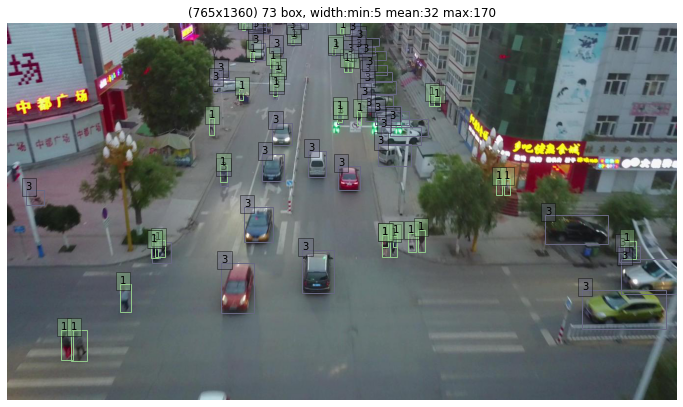

In [71]:
for example in tfds.as_numpy(dataset):
    #print(example[0].shape, example[1].shape)
    
    image = tf.cast(example[0], dtype=tf.float32)
    cls_bbox = example[1]        
    print('cls_bbox', np.mean(cls_bbox, 0))
    
    label = tf.cast(cls_bbox[:, 0],dtype=tf.int32)
    bbox = cls_bbox[:, 1:]
    h, w, c = image.shape    
    bbox_ori = bbox * np.array((h,w,h,w)).reshape((1, 4))
    
    visualize_detections_simple(image,bbox_ori,label)
    break

In [72]:
batch_size = 1 #6:OOM_E, [4,5]:OOM_W
autotune = tf.data.experimental.AUTOTUNE
train_dataset = dataset.map(preprocess_data, num_parallel_calls=autotune)
train_dataset = train_dataset.shuffle(8 * batch_size)
train_dataset = train_dataset.padded_batch(
    batch_size=batch_size, padding_values=(0.0, 1e-8, 1), drop_remainder=True
)
train_dataset = train_dataset.map(
    label_encoder.encode_batch, num_parallel_calls=autotune
)
train_dataset = train_dataset.apply(tf.data.experimental.ignore_errors())
train_dataset = train_dataset.prefetch(autotune)

val_dataset = dataset_test.map(preprocess_data, num_parallel_calls=autotune)
val_dataset = val_dataset.padded_batch(
    batch_size=batch_size, padding_values=(0.0, 1e-8, -1), drop_remainder=True
)
val_dataset = val_dataset.map(
    label_encoder.encode_batch, num_parallel_calls=autotune
)
val_dataset = val_dataset.apply(tf.data.experimental.ignore_errors())
val_dataset = val_dataset.prefetch(autotune)

In [73]:
#optimizer = tf.optimizers.SGD(learning_rate=1e-4, momentum=0.9)
optimizer = tf.optimizers.SGD(learning_rate=1e-4, clipvalue=10.0)#, clipnorm=1.0
model.compile(loss=loss_fn, optimizer=optimizer, metrics=[recall, precision])

callbacks_list = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath=model_dir,
        monitor="loss",
        save_best_only=False,
        save_weights_only=True,
        verbose=0,
    )
]

In [74]:
loss_list = []
loss_var_list = []
load_weight()
print(len(input_list_train))

latest_checkpoint retinanet/rect_anchor
77


In [75]:
epochs = 1000
hist = model.fit(
    train_dataset.take(1000),
    validation_data=None,#val_dataset.take(2)
    epochs=epochs,
    callbacks=callbacks_list,#callbacks_list
    verbose=1,
)

Epoch 1/1000
77/77 [==============================] - 24s 310ms/step - loss: 15.3702 - recall: 1.0103e-04 - precision: 0.0065
Epoch 2/1000
77/77 [==============================] - 24s 316ms/step - loss: 14.1784 - recall: 1.9202e-05 - precision: 0.0000e+00
Epoch 3/1000
77/77 [==============================] - 24s 316ms/step - loss: 14.3232 - recall: 4.3146e-06 - precision: 0.0000e+00
Epoch 4/1000
77/77 [==============================] - 24s 313ms/step - loss: 14.0142 - recall: 1.1422e-05 - precision: 0.0000e+00
Epoch 5/1000
77/77 [==============================] - 24s 314ms/step - loss: 14.0206 - recall: 0.0000e+00 - precision: 0.0000e+00
Epoch 6/1000
77/77 [==============================] - 24s 315ms/step - loss: 14.1507 - recall: 0.0000e+00 - precision: 0.0000e+00
Epoch 7/1000
77/77 [==============================] - 24s 316ms/step - loss: 13.7453 - recall: 0.0000e+00 - precision: 0.0000e+00
Epoch 8/1000
77/77 [==============================] - 24s 317ms/step - loss: 14.0238 - recall:

77/77 [==============================] - 24s 318ms/step - loss: 13.0084 - recall: 4.1393e-05 - precision: 0.0130
Epoch 64/1000
77/77 [==============================] - 24s 317ms/step - loss: 13.2050 - recall: 7.8572e-06 - precision: 0.0130
Epoch 65/1000
77/77 [==============================] - 24s 318ms/step - loss: 13.0571 - recall: 1.9299e-05 - precision: 0.0019
Epoch 66/1000
77/77 [==============================] - 24s 318ms/step - loss: 12.7311 - recall: 2.1440e-05 - precision: 0.0000e+00
Epoch 67/1000
77/77 [==============================] - 24s 318ms/step - loss: 13.0571 - recall: 2.6264e-05 - precision: 0.0000e+00
Epoch 68/1000
77/77 [==============================] - 25s 318ms/step - loss: 12.7772 - recall: 4.3146e-06 - precision: 0.0000e+00
Epoch 69/1000
77/77 [==============================] - 25s 319ms/step - loss: 12.7320 - recall: 1.2272e-05 - precision: 0.0000e+00
Epoch 70/1000
77/77 [==============================] - 25s 318ms/step - loss: 12.6678 - recall: 2.0614e-05 - 

Epoch 126/1000
77/77 [==============================] - 24s 317ms/step - loss: 12.3032 - recall: 1.0765e-04 - precision: 0.0000e+00
Epoch 127/1000
77/77 [==============================] - 24s 317ms/step - loss: 12.5500 - recall: 1.1710e-04 - precision: 0.0130
Epoch 128/1000
77/77 [==============================] - 24s 318ms/step - loss: 12.5047 - recall: 8.8886e-05 - precision: 0.0130
Epoch 129/1000
77/77 [==============================] - 24s 317ms/step - loss: 12.4185 - recall: 1.3517e-04 - precision: 0.0173
Epoch 130/1000
77/77 [==============================] - 24s 318ms/step - loss: 12.4063 - recall: 7.2866e-05 - precision: 0.0032
Epoch 131/1000
77/77 [==============================] - 25s 319ms/step - loss: 12.4718 - recall: 7.3361e-05 - precision: 0.0000e+00
Epoch 132/1000
77/77 [==============================] - 25s 318ms/step - loss: 12.5155 - recall: 1.3340e-04 - precision: 0.0000e+00
Epoch 133/1000
77/77 [==============================] - 25s 318ms/step - loss: 12.6485 - rec

Epoch 189/1000
77/77 [==============================] - 25s 319ms/step - loss: 12.4405 - recall: 2.5482e-04 - precision: 0.0052
Epoch 190/1000
77/77 [==============================] - 25s 319ms/step - loss: 12.2200 - recall: 2.8829e-04 - precision: 0.0020
Epoch 191/1000
77/77 [==============================] - 24s 318ms/step - loss: 12.9718 - recall: 1.5727e-04 - precision: 0.0000e+00
Epoch 192/1000
77/77 [==============================] - 24s 317ms/step - loss: 12.4276 - recall: 1.5859e-04 - precision: 0.0000e+00
Epoch 193/1000
77/77 [==============================] - 25s 320ms/step - loss: 12.2785 - recall: 2.2068e-04 - precision: 0.0000e+00
Epoch 194/1000
77/77 [==============================] - 25s 318ms/step - loss: 12.4031 - recall: 1.8111e-04 - precision: 0.0065
Epoch 195/1000
77/77 [==============================] - 25s 318ms/step - loss: 12.5971 - recall: 2.0938e-04 - precision: 0.0130
Epoch 196/1000
77/77 [==============================] - 25s 318ms/step - loss: 12.9162 - rec

77/77 [==============================] - 24s 317ms/step - loss: 11.8152 - recall: 3.1494e-04 - precision: 0.0000e+00
Epoch 253/1000
77/77 [==============================] - 24s 317ms/step - loss: 12.3271 - recall: 2.4821e-04 - precision: 0.0043
Epoch 254/1000
77/77 [==============================] - 24s 318ms/step - loss: 12.0301 - recall: 3.3210e-04 - precision: 0.0159
Epoch 255/1000
77/77 [==============================] - 24s 318ms/step - loss: 12.1683 - recall: 2.2266e-04 - precision: 0.0000e+00
Epoch 256/1000
77/77 [==============================] - 24s 317ms/step - loss: 11.9295 - recall: 2.2993e-04 - precision: 0.0000e+00
Epoch 257/1000
77/77 [==============================] - 24s 318ms/step - loss: 12.1495 - recall: 3.3321e-04 - precision: 0.0130
Epoch 258/1000
77/77 [==============================] - 25s 318ms/step - loss: 11.6163 - recall: 3.7225e-04 - precision: 0.0091
Epoch 259/1000
77/77 [==============================] - 24s 318ms/step - loss: 12.4638 - recall: 3.7681e-04

KeyboardInterrupt: 

In [724]:
epochs = 1000
hist = model.fit(
    train_dataset.take(1000),
    validation_data=None,#val_dataset.take(2)
    epochs=epochs,
    callbacks=callbacks_list,#callbacks_list
    verbose=1,
)

Epoch 1/1000
101/101 [==============================] - 29s 292ms/step - loss: 8.4278 - recall: 0.0772 - precision: 0.1104
Epoch 2/1000
101/101 [==============================] - 30s 294ms/step - loss: 8.2740 - recall: 0.0784 - precision: 0.1223
Epoch 3/1000
101/101 [==============================] - 30s 293ms/step - loss: 8.3884 - recall: 0.0664 - precision: 0.1058
Epoch 4/1000
101/101 [==============================] - 30s 294ms/step - loss: 8.4485 - recall: 0.0752 - precision: 0.1062
Epoch 5/1000
101/101 [==============================] - 30s 295ms/step - loss: 8.5981 - recall: 0.0721 - precision: 0.0968
Epoch 6/1000
101/101 [==============================] - 30s 296ms/step - loss: 8.5055 - recall: 0.0626 - precision: 0.1053
Epoch 7/1000
101/101 [==============================] - 30s 295ms/step - loss: 8.6220 - recall: 0.0749 - precision: 0.0957
Epoch 8/1000
101/101 [==============================] - 30s 295ms/step - loss: 8.6137 - recall: 0.0640 - precision: 0.0975
Epoch 9/1000
101

101/101 [==============================] - 30s 294ms/step - loss: 8.4073 - recall: 0.0737 - precision: 0.0982
Epoch 133/1000
101/101 [==============================] - 30s 293ms/step - loss: 8.2934 - recall: 0.0768 - precision: 0.1044
Epoch 134/1000
101/101 [==============================] - 30s 294ms/step - loss: 8.3839 - recall: 0.0778 - precision: 0.1012
Epoch 135/1000
101/101 [==============================] - 34s 333ms/step - loss: 8.1802 - recall: 0.0651 - precision: 0.1200
Epoch 136/1000
101/101 [==============================] - 29s 292ms/step - loss: 8.3128 - recall: 0.0678 - precision: 0.1102
Epoch 137/1000
101/101 [==============================] - 30s 294ms/step - loss: 8.4367 - recall: 0.0730 - precision: 0.1002
Epoch 138/1000
101/101 [==============================] - 30s 294ms/step - loss: 8.4988 - recall: 0.0769 - precision: 0.1008
Epoch 139/1000
101/101 [==============================] - 30s 294ms/step - loss: 8.4565 - recall: 0.0825 - precision: 0.0941
Epoch 140/1000


101/101 [==============================] - 30s 294ms/step - loss: 8.3165 - recall: 0.0841 - precision: 0.0926
Epoch 263/1000
101/101 [==============================] - 30s 295ms/step - loss: 8.2646 - recall: 0.0680 - precision: 0.1014
Epoch 264/1000
101/101 [==============================] - 30s 295ms/step - loss: 8.1572 - recall: 0.0790 - precision: 0.0999
Epoch 265/1000
101/101 [==============================] - 30s 296ms/step - loss: 8.1255 - recall: 0.0732 - precision: 0.1140
Epoch 266/1000
101/101 [==============================] - 30s 295ms/step - loss: 8.1959 - recall: 0.0785 - precision: 0.1067
Epoch 267/1000
101/101 [==============================] - 30s 295ms/step - loss: 8.2256 - recall: 0.0777 - precision: 0.1065
Epoch 268/1000
101/101 [==============================] - 30s 295ms/step - loss: 8.2334 - recall: 0.0724 - precision: 0.0962
Epoch 269/1000
101/101 [==============================] - 30s 295ms/step - loss: 8.2568 - recall: 0.0780 - precision: 0.0999
Epoch 270/1000


KeyboardInterrupt: 

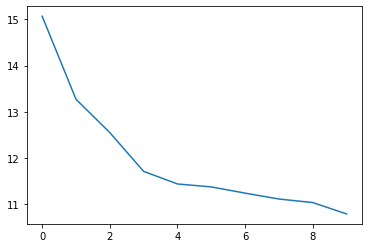

In [696]:
loss_list.extend(hist.history['loss'])

plt.plot(np.array(loss_list).reshape([-1]),label='train')

if 'val_loss' in hist.history.keys():
    loss_var_list.extend(hist.history['val_loss'])
    plt.plot(np.array(loss_var_list).reshape([-1]),label='valid')
    plt.legend()

In [59]:
image = tf.keras.Input(shape=[None, None, 3], name="image")
predictions = model(image, training=False)
detections = DecodePredictions(confidence_threshold=0.5, nms_iou_threshold=0.1)(image, predictions)
inference_model = tf.keras.Model(inputs=image, outputs=detections)

def prepare_image(image):
    image, _, ratio = resize_and_pad_image(image, jitter=None)
    return tf.expand_dims(image, axis=0), ratio

In [60]:
def check_test(test_datas, bboxs_label):
    i = 0
    for image, cbbox in test_datas: 
        if i%10==0:
            bbox_annotation = bboxs_label[i]
            scale = np.array(image.shape[:2])
            scale = np.reshape(scale, [1, 2])
            scale = np.concatenate((scale, scale), 1)
            gt_bbox = bbox_annotation[ :, 1:] * scale
            input_image, ratio = prepare_image(image)
            input_image = tf.keras.applications.resnet.preprocess_input(input_image)#?        
            detections = inference_model.predict(input_image)        
            num_detections = detections.valid_detections[0]
            print('num_detections', num_detections, image.shape, input_image.dtype, np.min(input_image), np.max(input_image))
            print('cls', np.unique(detections.nmsed_classes[0][:num_detections]))
          
            class_names = [WATER_CLASSES[(int(x))] for x in detections.nmsed_classes[0][:num_detections]    ]
            visualize_detections(
                image,
                detections.nmsed_boxes[0][:num_detections] / ratio,
                class_names,
                detections.nmsed_scores[0][:num_detections],
                boxes_gt=gt_bbox
            )
        i+=1
       
    

num_detections 19 (765, 1360, 3) <dtype: 'float32'> -123.68 151.061
cls [0. 2.]


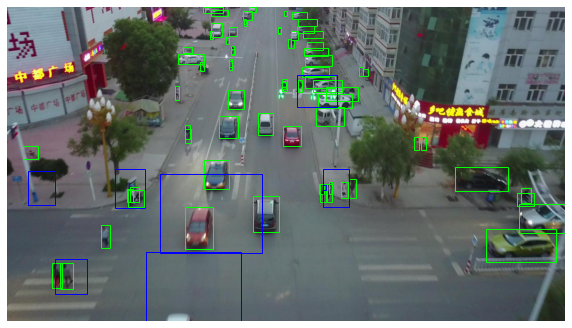

num_detections 30 (765, 1360, 3) <dtype: 'float32'> -123.68 148.23718
cls [0. 2.]


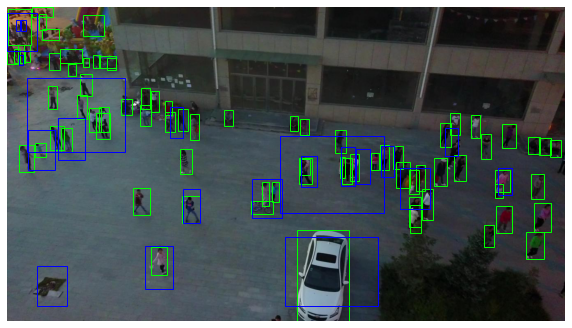

num_detections 52 (765, 1360, 3) <dtype: 'float32'> -123.68 150.96872
cls [0. 2.]


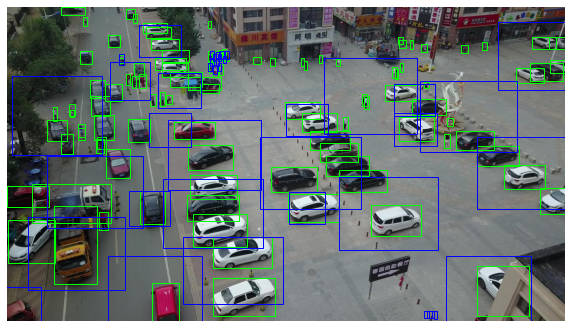

num_detections 68 (765, 1360, 3) <dtype: 'float32'> -123.68 151.061
cls [0. 2.]


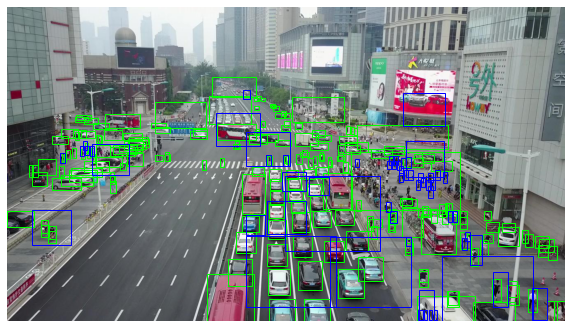

num_detections 38 (765, 1360, 3) <dtype: 'float32'> -123.68 151.061
cls [0. 2.]


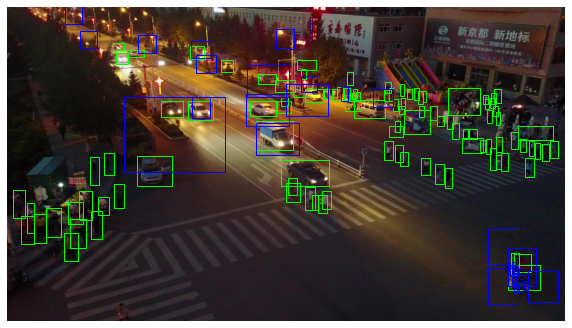

num_detections 29 (765, 1360, 3) <dtype: 'float32'> -123.68 151.061
cls [0. 2.]


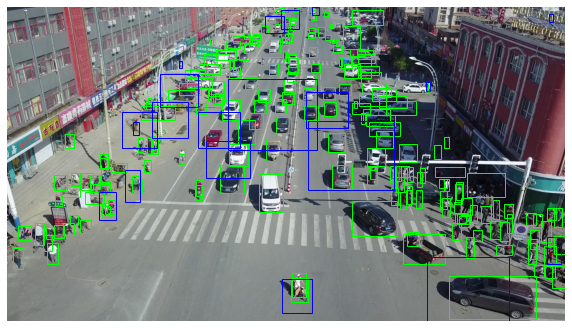

num_detections 243 (540, 960, 3) <dtype: 'float32'> -123.68 151.061
cls [0. 2.]


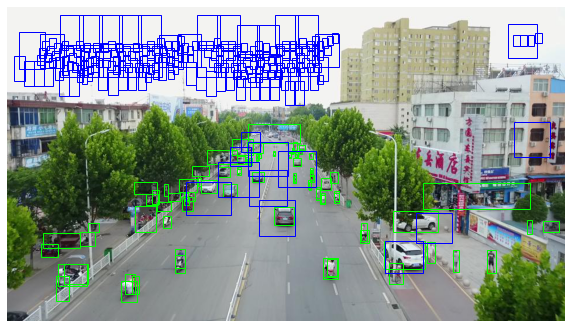

num_detections 75 (540, 960, 3) <dtype: 'float32'> -123.68 146.07498
cls [0. 2.]


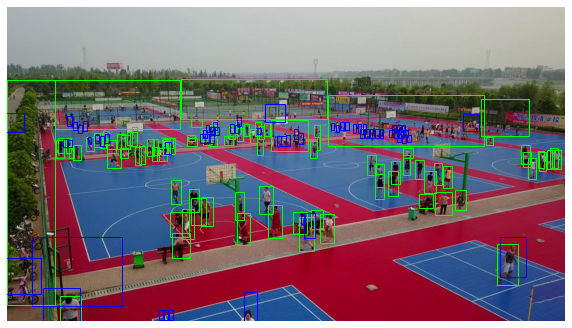

In [76]:
check_test(dataset, bbox_list_train)

num_detections 686 (1080, 1920, 3) <dtype: 'float32'> -123.68 149.19391
cls [0. 2.]


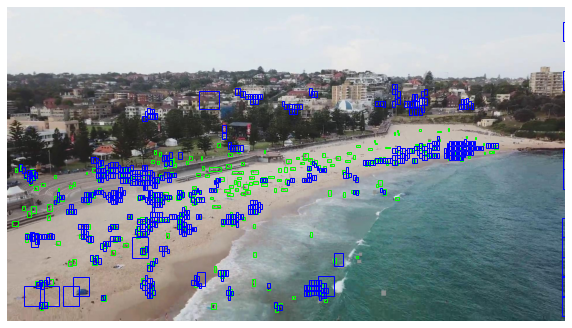

num_detections 530 (1080, 1920, 3) <dtype: 'float32'> -123.68 151.061
cls [0. 2.]


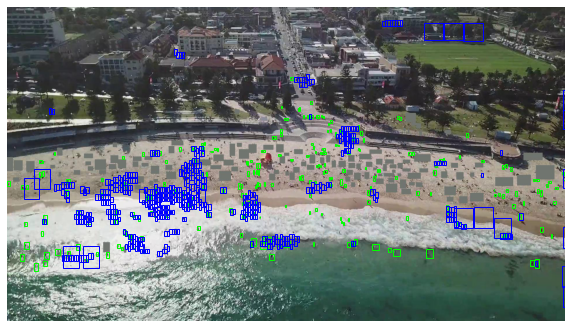

num_detections 467 (1080, 1920, 3) <dtype: 'float32'> -123.68 127.16268
cls [0.]


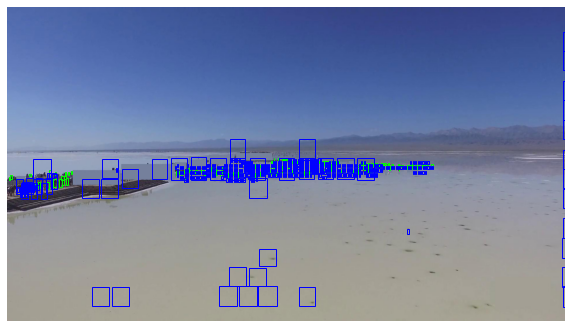

num_detections 142 (540, 960, 3) <dtype: 'float32'> -123.68 150.86176
cls [0. 2.]


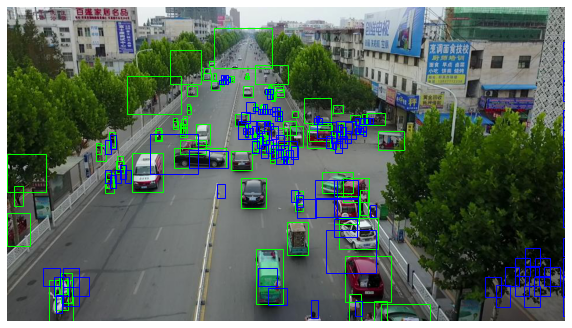

num_detections 192 (540, 960, 3) <dtype: 'float32'> -123.68 150.97647
cls [0. 2.]


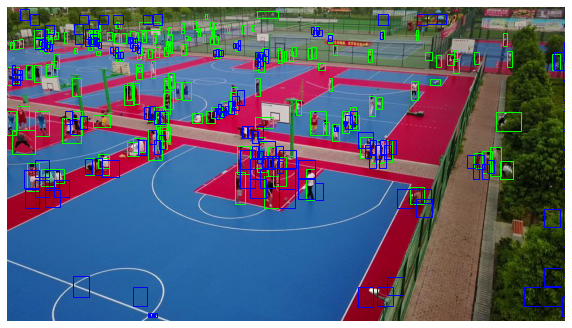

num_detections 74 (540, 960, 3) <dtype: 'float32'> -123.68 150.41608
cls [0. 2.]


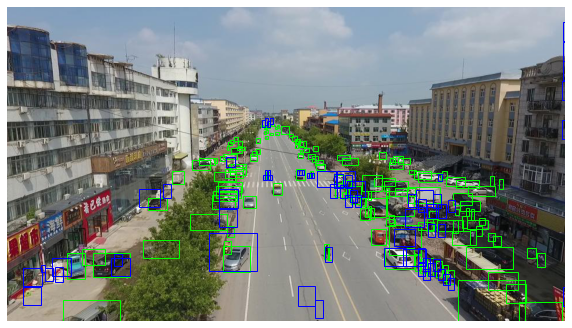

num_detections 41 (765, 1360, 3) <dtype: 'float32'> -123.68 151.061
cls [0. 2.]


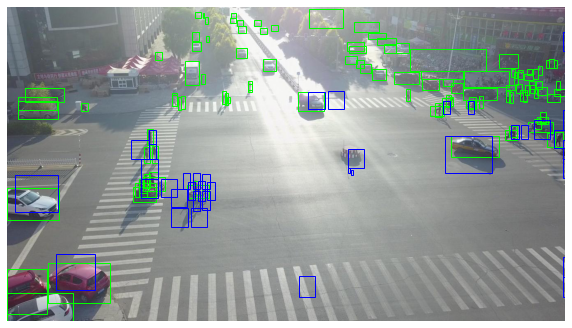

num_detections 164 (765, 1360, 3) <dtype: 'float32'> -123.68 151.061
cls [0. 2.]


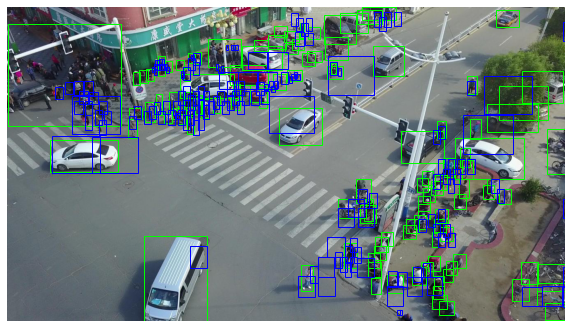

num_detections 121 (765, 1360, 3) <dtype: 'float32'> -123.68 151.061
cls [0. 2.]


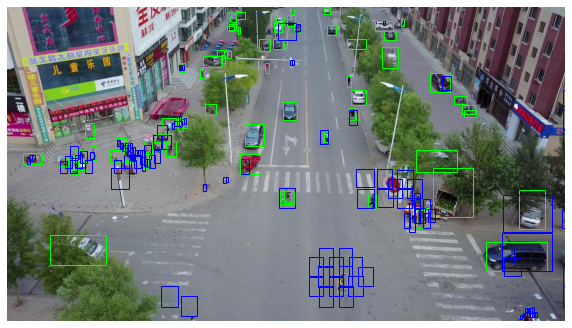

num_detections 127 (540, 960, 3) <dtype: 'float32'> -123.68 151.061
cls [0. 2.]


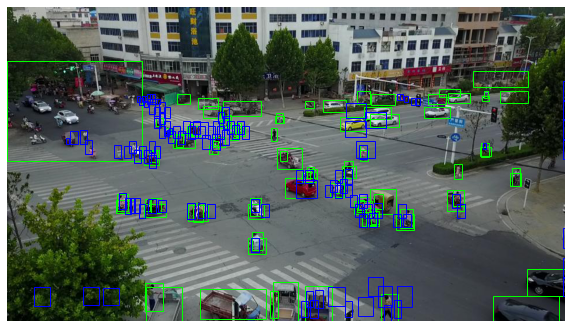

In [703]:
check_test(dataset_test, bbox_list_test)

num_detections 24 (1080, 1920, 3) 1474.7352 1964.0166


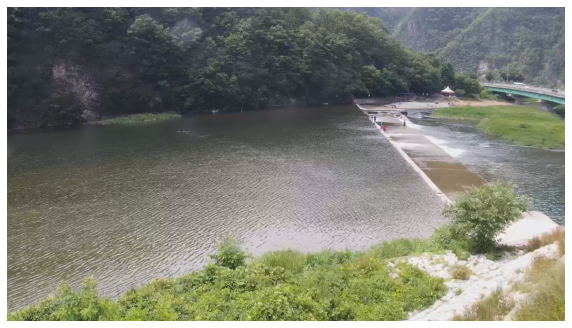

num_detections 20 (1080, 1920, 3) 1479.5388 3723.4468


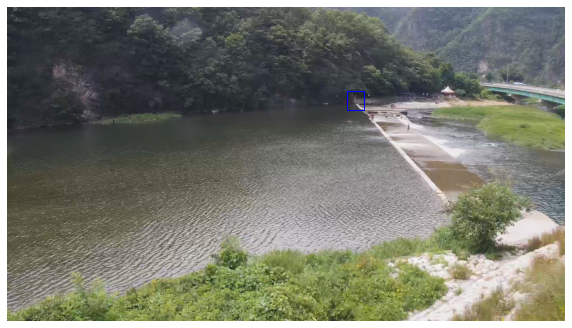

num_detections 24 (1080, 1920, 3) 202.31339 1915.0646


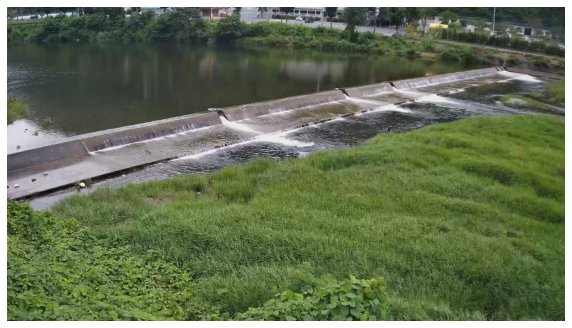

num_detections 24 (1080, 1920, 3) 183.3805 1931.7428


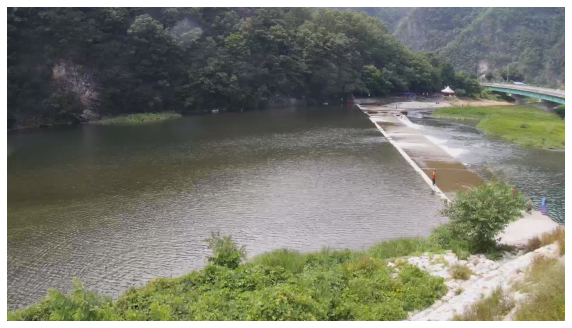

num_detections 32 (1080, 1920, 3) 1455.4165 2769.7952


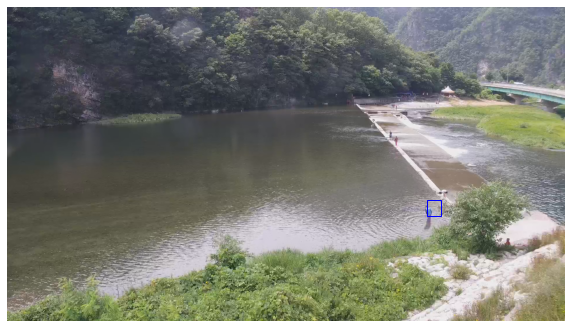

num_detections 26 (1080, 1920, 3) 1420.7767 1903.4979


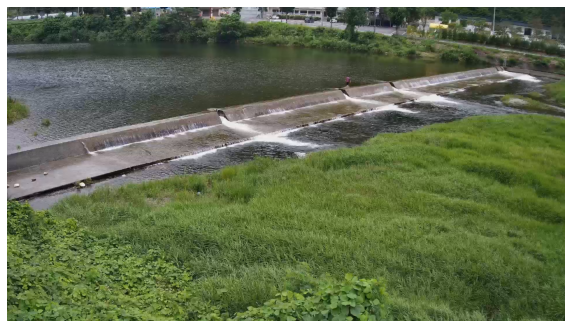

num_detections 31 (1080, 1920, 3) 198.25931 3656.988


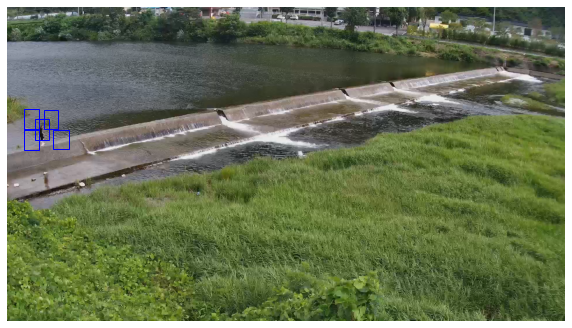

num_detections 30 (1080, 1920, 3) 177.84024 1916.745


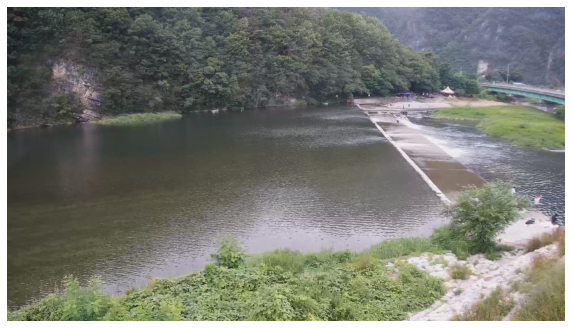

num_detections 26 (1080, 1920, 3) 200.42226 1883.1722


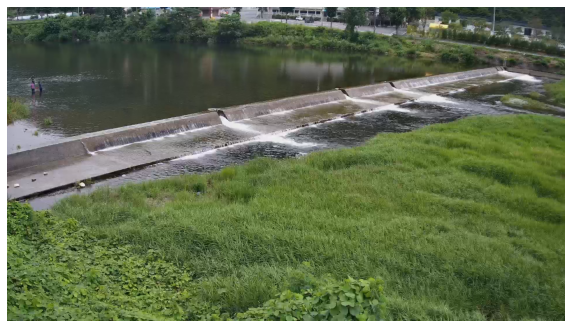

num_detections 33 (1080, 1920, 3) 180.17485 1921.947


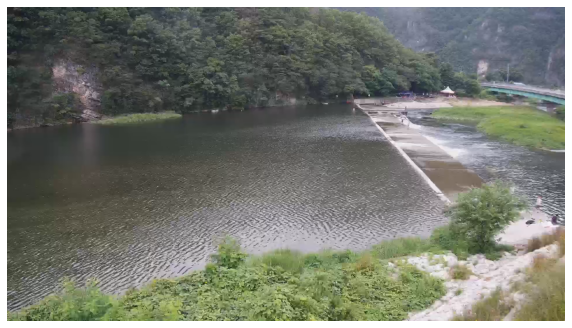

In [728]:
for i in range(len(water_images)):
    if i%10!=0: continue
        
    image = water_images[i]
    input_image, ratio = prepare_image(image)
    detections = inference_model.predict(input_image)        
    num_detections = detections.valid_detections[0]
    bbox = detections.nmsed_boxes[0][:num_detections] / ratio
    if len(bbox)>0:
        bbox_area = np.prod(bbox[:, 2:] - bbox[:, 0:2], axis=1)
        bbox_area_min = np.min(bbox_area)
        bbox_area_max = np.max(bbox_area)
        print('num_detections', num_detections, image.shape, bbox_area_min, bbox_area_max)

    #print('detections.nmsed_boxes[0][:num_detections] / ratio', detections.nmsed_boxes[0][:num_detections] / ratio)
    #[725.67  18.77 729.72  27.03]
    class_names = [WATER_CLASSES[(int(x))] for x in detections.nmsed_classes[0][:num_detections]    ]
    visualize_detections(
        image,
        detections.nmsed_boxes[0][:num_detections] / ratio,
        class_names,
        detections.nmsed_scores[0][:num_detections]        
    )
    

In [223]:
def check_ground_truth(test_datas, bboxs_label):
    i = 0
    for image, cbbox in test_datas: 
        if np.random.rand()<0.3:
            i+=1
            continue

        bbox_annotation = bboxs_label[i]
        scale = np.array(image.shape[:2])
        scale = np.reshape(scale, [1, 2])
        scale = np.concatenate((scale, scale), 1)
        gt_bbox = bbox_annotation[ :, 1:] * scale
        input_image, ratio = prepare_image(image)
        detections = inference_model.predict(input_image)        
        num_detections = detections.valid_detections[0]
        print('num_detections', num_detections, image.shape)
        
        #print('detections.nmsed_boxes[0][:num_detections] / ratio', detections.nmsed_boxes[0][:num_detections] / ratio)
        #[725.67  18.77 729.72  27.03]
        class_names = [WATER_CLASSES[(int(x))] for x in detections.nmsed_classes[0][:num_detections]    ]
        visualize_detections(
            image,
            detections.nmsed_boxes[0][:num_detections] / ratio,
            class_names,
            detections.nmsed_scores[0][:num_detections],
            boxes_gt=gt_bbox
        )
        i+=1
        if i>10:

            break
    

In [ ]:
for image, cbbox in dataset: 
    bbox = cbbox[:, :4]
    cls = cbbox[:, 0]
    print('cbbox', cbbox.shape)
    break

In [611]:
num_classes

100

In [565]:
#label = tf.concat([box_target, cls_target], axis=-1)
for image, cbbox in train_dataset:         
    cls_gt = cbbox[:,:,-2]
    size_gt = cbbox[:,:,-1]
    
    small_count = np.sum(np.logical_and(cls_gt>0, np.logical_and(size_gt< 6*6, size_gt>=0.5)))
    positive_count = np.sum(cls_gt>0)
    #print('cbbox', cbbox.shape, np.min(size_gt), np.mean(size_gt), np.max(size_gt), small_count, positive_count)
    #cbbox (3, 40800, 6) 0.0 12.705692 22272.002 0 382
    print(np.sum(cls_gt < 0.0), np.sum(cls_gt == 0.0), np.sum(cls_gt == 1.0), np.sum(cls_gt > 1.0))
    
    

189 40388 223 0
804 39777 219 0
486 39983 331 0
1188 38948 664 0
199 40256 345 0
1705 38598 497 0
1496 38944 360 0
3077 37463 260 0
660 39596 544 0
539 39864 397 0
2646 37713 441 0
707 39592 501 0
2039 38104 657 0
1889 38596 315 0
308 40092 400 0
1233 38910 657 0
146 40377 277 0
88 40439 273 0
953 39739 52 56
1407 38982 411 0
1154 39558 36 52
1199 39466 40 95
1262 39001 537 0
2360 38175 141 124
544 39953 303 0
1802 38808 87 103
1141 38977 682 0
883 39836 79 2
830 39851 34 85
1325 39098 377 0
1152 39530 59 59
1416 39220 72 92
1209 39468 62 61
1187 39473 44 96
2181 38413 95 111
1157 39544 54 45
2216 38351 178 55
1062 39639 39 60
1472 39185 64 79
1290 39376 44 90
1396 39257 53 94
2190 38319 291 0
760 39968 26 46
1038 39652 91 19
1248 39438 38 76
1280 39390 75 55
1026 39634 34 106
1112 39556 52 80
1620 39033 56 91
2312 38256 164 68
710 40011 39 40
1624 38961 118 97
1141 39549 37 73
908 39796 51 45
967 39744 40 49
1734 38858 206 2
554 40198 46 2
1184 39445 75 96
1692 38920 104 84
463 40267 

In [157]:
for image, cbbox in train_dataset:         
    bbox_gt = cbbox[:,:,:4]
    cls_gt = cbbox[:,:,-1]  
    print('cbbox', cbbox.shape, cbbox[0, 0])
    break
    #print('detections.nmsed_boxes[0][:num_detections] / ratio', detections.nmsed_boxes[0][:num_detections] / ratio)
    #[725.67  18.77 729.72  27.03]
    class_names = [WATER_CLASSES[(int(x))] for x in detections.nmsed_classes[0][:num_detections]    ]
    visualize_detections(
        image,
        detections.nmsed_boxes[0][:num_detections] / ratio,
        class_names,
        detections.nmsed_scores[0][:num_detections],
        boxes_gt=gt_bbox
    )


cbbox (1, 40800, 5) tf.Tensor([261.88 623.28  -1.44   3.79   0.  ], shape=(5,), dtype=float32)
